In [1]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
train_set = pd.read_csv('C:/Users/pmh1407/Downloads/WIDS/training_v2.csv')
test_set = pd.read_csv('C:/Users/pmh1407/Downloads/WIDS/unlabeled.csv')

In [3]:
random.seed(32)

In [4]:
train_set.T.head(n=50)

,0,1,2,3,4,5,6,7,8,9,...,91703,91704,91705,91706,91707,91708,91709,91710,91711,91712
encounter_id,66154,114252,119783,79267,92056,33181,82208,120995,80471,42871,...,65539,96325,111411,127138,276,91592,66119,8981,33776,1671
patient_id,25312,59342,50777,46918,34377,74489,49526,50129,10577,90749,...,128056,77671,7848,59223,34638,78108,13486,58179,120598,53612
hospital_id,118,81,118,118,33,83,83,33,118,118,...,30,30,195,121,183,30,121,195,66,104
hospital_death,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
age,68,77,25,81,19,67,59,70,45,50,...,53,38,67,54,NaN,75,56,48,NaN,82
bmi,22.73,27.42,31.95,22.64,NaN,27.56,57.45,NaN,NaN,25.71,...,45.9352,32.9929,28.8768,19.7704,33.9335,23.0603,47.1797,27.2369,23.2975,22.0312
elective_surgery,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
ethnicity,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,NaN,...,Caucasian,Caucasian,African American,Native American,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian
gender,M,F,F,F,M,M,F,M,M,M,...,M,M,M,M,F,M,F,M,F,F
height,180.3,160,172.7,165.1,188,190.5,165.1,165,170.2,175.3,...,190.5,177.8,182.9,177.8,152,177.8,183,170.2,154.9,160


In [5]:
test_set.T.head(n=50)

,0,1,2,3,4,5,6,7,8,9,...,39298,39299,39300,39301,39302,39303,39304,39305,39306,39307
encounter_id,2,5,7,8,10,16,18,19,23,25,...,131018,131020,131021,131022,131029,131035,131037,131039,131041,131050
patient_id,127112,130737,101458,48067,25865,75049,89318,101385,90017,120402,...,130620,103975,5822,103976,105628,12233,56614,106611,18175,72213
hospital_id,7,178,86,163,59,175,172,162,28,175,...,86,165,11,115,106,163,86,152,164,11
hospital_death,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,56,NaN,66,64,56,55,79,64,58,64,...,70,40,69,44,64,35,63,71,57,66
bmi,21.1024,19.5006,32.5186,20.7985,NaN,27.9938,23.4741,21.7951,36.2006,20.9366,...,53.7834,27.7735,28.3447,20.5375,29.3508,35.0386,29.3523,23.0104,32.9879,23.1834
elective_surgery,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
ethnicity,Caucasian,Caucasian,African American,Caucasian,Caucasian,African American,Caucasian,Caucasian,Caucasian,African American,...,Caucasian,African American,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,African American
gender,M,F,M,M,M,M,F,M,F,F,...,M,M,M,F,F,F,M,M,M,F
height,180.3,145,170.2,182.8,NaN,180,170.2,187.96,157.5,165,...,170.2,177.8,168,152.4,162.6,170.2,175.3,170,185.4,170


In [6]:
train_set.T.tail(n=50)

,0,1,2,3,4,5,6,7,8,9,...,91703,91704,91705,91706,91707,91708,91709,91710,91711,91712
h1_creatinine_max,NaN,0.56,NaN,NaN,NaN,NaN,0.78,NaN,1.16,0.83,...,1.4,NaN,NaN,0.7,NaN,1.1,NaN,NaN,NaN,NaN
h1_creatinine_min,NaN,0.56,NaN,NaN,NaN,NaN,0.78,NaN,1.16,0.83,...,1.4,NaN,NaN,0.7,NaN,1.1,NaN,NaN,NaN,NaN
h1_glucose_max,NaN,145,NaN,NaN,NaN,NaN,197,NaN,365,134,...,152,83,204,91,NaN,208,NaN,NaN,NaN,NaN
h1_glucose_min,NaN,143,NaN,NaN,NaN,NaN,194,NaN,365,134,...,152,75,125,91,NaN,208,NaN,NaN,NaN,NaN
h1_hco3_max,NaN,27,NaN,NaN,NaN,NaN,30,NaN,23,28,...,26,NaN,NaN,30,NaN,28,NaN,NaN,NaN,NaN
h1_hco3_min,NaN,27,NaN,NaN,NaN,NaN,30,NaN,23,28,...,26,NaN,NaN,30,NaN,28,NaN,NaN,NaN,NaN
h1_hemaglobin_max,NaN,11.3,NaN,11.6,NaN,NaN,10.7,NaN,12.3,12.8,...,12.7,NaN,NaN,14.2,NaN,13.2,NaN,NaN,NaN,NaN
h1_hemaglobin_min,NaN,11.3,NaN,11.6,NaN,NaN,10.7,NaN,12.3,12.8,...,12.7,NaN,NaN,14.2,NaN,13.2,NaN,NaN,NaN,NaN
h1_hematocrit_max,NaN,36.9,NaN,34,NaN,NaN,33.5,NaN,37.9,37.2,...,37,NaN,NaN,41,NaN,39,NaN,NaN,NaN,NaN
h1_hematocrit_min,NaN,36.9,NaN,34,NaN,NaN,33.5,NaN,37.9,37.2,...,37,NaN,NaN,41,NaN,39,NaN,NaN,NaN,NaN


In [7]:
test_set.T.tail(n=50)

,0,1,2,3,4,5,6,7,8,9,...,39298,39299,39300,39301,39302,39303,39304,39305,39306,39307
h1_creatinine_max,NaN,NaN,NaN,0.75,NaN,NaN,NaN,NaN,NaN,0.87,...,NaN,NaN,1.48,NaN,NaN,NaN,NaN,NaN,NaN,7.12
h1_creatinine_min,NaN,NaN,NaN,0.75,NaN,NaN,NaN,NaN,NaN,0.87,...,NaN,NaN,1.48,NaN,NaN,NaN,NaN,NaN,NaN,7.12
h1_glucose_max,NaN,NaN,NaN,122,NaN,NaN,75,NaN,NaN,172,...,112,109,143,142,68,NaN,349,NaN,NaN,129
h1_glucose_min,NaN,NaN,NaN,122,NaN,NaN,75,NaN,NaN,172,...,112,109,143,142,68,NaN,349,NaN,NaN,129
h1_hco3_max,NaN,NaN,NaN,22,NaN,NaN,NaN,NaN,NaN,29,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24
h1_hco3_min,NaN,NaN,NaN,22,NaN,NaN,NaN,NaN,NaN,29,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24
h1_hemaglobin_max,NaN,NaN,NaN,11,NaN,15.1,NaN,NaN,NaN,10,...,NaN,13.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
h1_hemaglobin_min,NaN,NaN,NaN,11,NaN,15.1,NaN,NaN,NaN,10,...,NaN,13.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
h1_hematocrit_max,NaN,NaN,NaN,32,NaN,46.6,NaN,NaN,NaN,31.2,...,NaN,37.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
h1_hematocrit_min,NaN,NaN,NaN,32,NaN,46.6,NaN,NaN,NaN,31.2,...,NaN,37.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
print(train_set.columns.values)

['encounter_id' 'patient_id' 'hospital_id' 'hospital_death' 'age' 'bmi'
 'elective_surgery' 'ethnicity' 'gender' 'height' 'hospital_admit_source'
 'icu_admit_source' 'icu_id' 'icu_stay_type' 'icu_type' 'pre_icu_los_days'
 'readmission_status' 'weight' 'albumin_apache' 'apache_2_diagnosis'
 'apache_3j_diagnosis' 'apache_post_operative' 'arf_apache'
 'bilirubin_apache' 'bun_apache' 'creatinine_apache' 'fio2_apache'
 'gcs_eyes_apache' 'gcs_motor_apache' 'gcs_unable_apache'
 'gcs_verbal_apache' 'glucose_apache' 'heart_rate_apache'
 'hematocrit_apache' 'intubated_apache' 'map_apache' 'paco2_apache'
 'paco2_for_ph_apache' 'pao2_apache' 'ph_apache' 'resprate_apache'
 'sodium_apache' 'temp_apache' 'urineoutput_apache' 'ventilated_apache'
 'wbc_apache' 'd1_diasbp_invasive_max' 'd1_diasbp_invasive_min'
 'd1_diasbp_max' 'd1_diasbp_min' 'd1_diasbp_noninvasive_max'
 'd1_diasbp_noninvasive_min' 'd1_heartrate_max' 'd1_heartrate_min'
 'd1_mbp_invasive_max' 'd1_mbp_invasive_min' 'd1_mbp_max' 'd1_mbp_mi

In [9]:
print(test_set.columns.values)

['encounter_id' 'patient_id' 'hospital_id' 'hospital_death' 'age' 'bmi'
 'elective_surgery' 'ethnicity' 'gender' 'height' 'hospital_admit_source'
 'icu_admit_source' 'icu_id' 'icu_stay_type' 'icu_type' 'pre_icu_los_days'
 'readmission_status' 'weight' 'albumin_apache' 'apache_2_diagnosis'
 'apache_3j_diagnosis' 'apache_post_operative' 'arf_apache'
 'bilirubin_apache' 'bun_apache' 'creatinine_apache' 'fio2_apache'
 'gcs_eyes_apache' 'gcs_motor_apache' 'gcs_unable_apache'
 'gcs_verbal_apache' 'glucose_apache' 'heart_rate_apache'
 'hematocrit_apache' 'intubated_apache' 'map_apache' 'paco2_apache'
 'paco2_for_ph_apache' 'pao2_apache' 'ph_apache' 'resprate_apache'
 'sodium_apache' 'temp_apache' 'urineoutput_apache' 'ventilated_apache'
 'wbc_apache' 'd1_diasbp_invasive_max' 'd1_diasbp_invasive_min'
 'd1_diasbp_max' 'd1_diasbp_min' 'd1_diasbp_noninvasive_max'
 'd1_diasbp_noninvasive_min' 'd1_heartrate_max' 'd1_heartrate_min'
 'd1_mbp_invasive_max' 'd1_mbp_invasive_min' 'd1_mbp_max' 'd1_mbp_mi

In [10]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Columns: 186 entries, encounter_id to apache_2_bodysystem
dtypes: float64(170), int64(8), object(8)
memory usage: 130.1+ MB


In [11]:
test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39308 entries, 0 to 39307
Columns: 186 entries, encounter_id to apache_2_bodysystem
dtypes: float64(171), int64(7), object(8)
memory usage: 55.8+ MB


In [12]:
train_set.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,91713.0,65606.079280,37795.088538,1.0,32852.0,65665.0,98342.0,131051.0
patient_id,91713.0,65537.131464,37811.252183,1.0,32830.0,65413.0,98298.0,131051.0
hospital_id,91713.0,105.669262,62.854406,2.0,47.0,109.0,161.0,204.0
hospital_death,91713.0,0.086302,0.280811,0.0,0.0,0.0,0.0,1.0
age,87485.0,62.309516,16.775119,16.0,52.0,65.0,75.0,89.0
...,...,...,...,...,...,...,...,...
hepatic_failure,90998.0,0.012989,0.113229,0.0,0.0,0.0,0.0,1.0
immunosuppression,90998.0,0.026165,0.159628,0.0,0.0,0.0,0.0,1.0
leukemia,90998.0,0.007066,0.083763,0.0,0.0,0.0,0.0,1.0
lymphoma,90998.0,0.004132,0.064148,0.0,0.0,0.0,0.0,1.0


In [13]:
test_set.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,39308.0,65346.396891,37920.612047,2.0,32568.50,65222.0,98174.50,131050.0
patient_id,39308.0,65504.743462,37878.696746,11.0,32590.25,65753.5,98270.25,131050.0
hospital_id,39308.0,107.102524,64.949586,1.0,58.00,115.0,165.00,203.0
hospital_death,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,37654.0,61.313991,16.828987,16.0,51.00,63.0,74.00,89.0
...,...,...,...,...,...,...,...,...
hepatic_failure,39129.0,0.015027,0.121663,0.0,0.00,0.0,0.00,1.0
immunosuppression,39129.0,0.024534,0.154703,0.0,0.00,0.0,0.00,1.0
leukemia,39129.0,0.007871,0.088372,0.0,0.00,0.0,0.00,1.0
lymphoma,39129.0,0.004319,0.065578,0.0,0.00,0.0,0.00,1.0


In [14]:
train_set.describe(include=['O']).T

,count,unique,top,freq
ethnicity,90318,6,Caucasian,70684
gender,91688,2,M,49469
hospital_admit_source,70304,15,Emergency Department,36962
icu_admit_source,91601,5,Accident & Emergency,54060
icu_stay_type,91713,3,admit,86183
icu_type,91713,8,Med-Surg ICU,50586
apache_3j_bodysystem,90051,11,Cardiovascular,29999
apache_2_bodysystem,90051,10,Cardiovascular,38816


In [15]:
test_set.describe(include=['O']).T

,count,unique,top,freq
ethnicity,39137,6,Caucasian,30240
gender,39293,2,M,21512
hospital_admit_source,27360,14,Emergency Department,14656
icu_admit_source,39193,5,Accident & Emergency,23130
icu_stay_type,39308,3,admit,39080
icu_type,39308,8,Med-Surg ICU,21368
apache_3j_bodysystem,38412,11,Cardiovascular,11393
apache_2_bodysystem,38412,10,Cardiovascular,14829


In [16]:
df = train_set.copy(deep=True)

In [17]:
dft = test_set.copy(deep=True)

In [18]:
# ethnicity, gender,  apache_3j_bodysystem, apache_2_bodysystem, age, bmi, apache_4a_hospital_death_prob, apache_4a_icu_death_prob

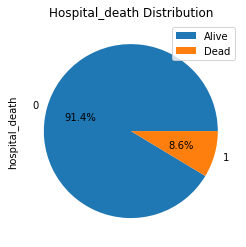

In [19]:
df['hospital_death'].value_counts().plot(kind='pie',autopct='%1.1f%%', title="Hospital_death Distribution")
plt.legend(("Alive","Dead"))

In [20]:
#skewness and kurtosis
print("Skewness: %f" % df['hospital_death'].skew())
print("Kurtosis: %f" % df['hospital_death'].kurt())

Skewness: 2.946519
Kurtosis: 6.682122


In [21]:
df.sample(6)
df.astype(df.dtypes.to_dict()) # transform dtypes to dict for easier manipulation

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.950000,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.640000,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,91592,78108,30,0,75.0,23.060250,0,Caucasian,M,177.8,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,66119,13486,121,0,56.0,47.179671,0,Caucasian,F,183.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,8981,58179,195,0,48.0,27.236914,0,Caucasian,M,170.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,33776,120598,66,0,NaN,23.297481,0,Caucasian,F,154.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [22]:
dft.sample(6)
dft.astype(dft.dtypes.to_dict())

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,2,127112,7,NaN,56.0,21.102439,0,Caucasian,M,180.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
1,5,130737,178,NaN,NaN,19.500595,1,Caucasian,F,145.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
2,7,101458,86,NaN,66.0,32.518596,1,African American,M,170.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
3,8,48067,163,NaN,64.0,20.798520,0,Caucasian,M,182.8,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Respiratory,Respiratory
4,10,25865,59,NaN,56.0,NaN,0,Caucasian,M,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39303,131035,12233,163,NaN,35.0,35.038615,1,Caucasian,F,170.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
39304,131037,56614,86,NaN,63.0,29.352338,0,Caucasian,M,175.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Gastrointestinal,Gastrointestinal
39305,131039,106611,152,NaN,71.0,23.010381,0,Caucasian,M,170.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
39306,131041,18175,164,NaN,57.0,32.987948,0,Caucasian,M,185.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular


In [23]:
# Drop apache_4a cols because it's prediction from another source and we shouldn't rely on that
cols_affect = ['apache_4a_hospital_death_prob','apache_4a_icu_death_prob']
df.drop(cols_affect, axis=1)

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.950000,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.640000,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,91592,78108,30,0,75.0,23.060250,0,Caucasian,M,177.8,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,66119,13486,121,0,56.0,47.179671,0,Caucasian,F,183.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,8981,58179,195,0,48.0,27.236914,0,Caucasian,M,170.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,33776,120598,66,0,NaN,23.297481,0,Caucasian,F,154.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [24]:
dft.drop(cols_affect, axis=1)

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,2,127112,7,NaN,56.0,21.102439,0,Caucasian,M,180.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
1,5,130737,178,NaN,NaN,19.500595,1,Caucasian,F,145.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
2,7,101458,86,NaN,66.0,32.518596,1,African American,M,170.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
3,8,48067,163,NaN,64.0,20.798520,0,Caucasian,M,182.8,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Respiratory,Respiratory
4,10,25865,59,NaN,56.0,NaN,0,Caucasian,M,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39303,131035,12233,163,NaN,35.0,35.038615,1,Caucasian,F,170.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
39304,131037,56614,86,NaN,63.0,29.352338,0,Caucasian,M,175.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Gastrointestinal,Gastrointestinal
39305,131039,106611,152,NaN,71.0,23.010381,0,Caucasian,M,170.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
39306,131041,18175,164,NaN,57.0,32.987948,0,Caucasian,M,185.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular


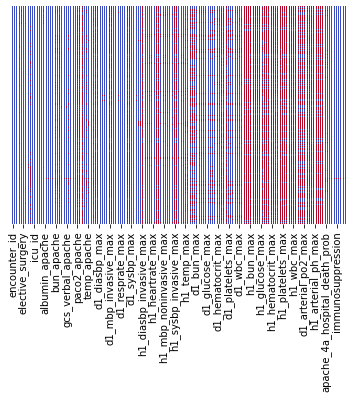

In [25]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap="coolwarm")

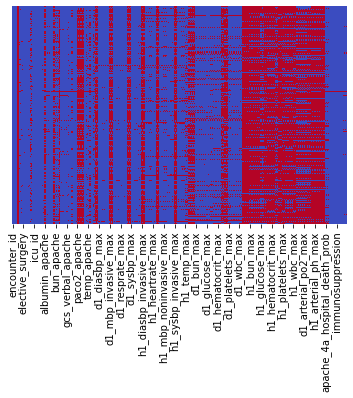

In [26]:
sns.heatmap(dft.isnull(),yticklabels=False,cbar=False,cmap="coolwarm")

In [27]:
#Set the console bigger
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', '{:20,.2f}'.format)
pd.set_option('display.max_colwidth', None)

In [28]:
df.isnull().sum()

encounter_id                         0
patient_id                           0
hospital_id                          0
hospital_death                       0
age                               4228
bmi                               3429
elective_surgery                     0
ethnicity                         1395
gender                              25
height                            1334
hospital_admit_source            21409
icu_admit_source                   112
icu_id                               0
icu_stay_type                        0
icu_type                             0
pre_icu_los_days                     0
readmission_status                   0
weight                            2720
albumin_apache                   54379
apache_2_diagnosis                1662
apache_3j_diagnosis               1101
apache_post_operative                0
arf_apache                         715
bilirubin_apache                 58134
bun_apache                       19262
creatinine_apache        

In [29]:
df = df.loc[:,df.isnull().mean() < .6]
df

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,h1_glucose_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.00,22.73,0,Caucasian,M,180.30,Floor,Floor,92,admit,CTICU,0.54,0,73.90,2.30,113.00,502.01,0,0.00,31.00,2.51,3.00,6.00,0.00,4.00,168.00,118.00,27.40,0.00,40.00,36.00,134.00,39.30,nan,0.00,14.10,68.00,37.00,68.00,37.00,119.00,72.00,89.00,46.00,89.00,46.00,34.00,10.00,100.00,74.00,131.00,73.00,131.00,73.00,39.90,37.20,68.00,63.00,68.00,63.00,119.00,108.00,86.00,85.00,86.00,85.00,26.00,18.00,100.00,74.00,131.00,115.00,131.00,115.00,39.50,37.50,2.30,2.30,0.40,0.40,31.00,30.00,8.50,7.40,2.51,2.23,168.00,109.00,19.00,15.00,8.90,8.90,27.40,27.40,233.00,233.00,4.00,3.40,136.00,134.00,14.10,14.10,nan,nan,0.10,0.05,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,Sepsis,Cardiovascular
1,114252,59342,81,0,77.00,27.42,0,Caucasian,F,160.00,Floor,Floor,90,admit,Med-Surg ICU,0.93,0,70.20,nan,108.00,203.01,0,0.00,9.00,0.56,1.00,3.00,0.00,1.00,145.00,120.00,36.90,0.00,46.00,33.00,145.00,35.10,nan,1.00,12.70,95.00,31.00,95.00,31.00,118.00,72.00,120.00,38.00,120.00,38.00,32.00,12.00,100.00,70.00,159.00,67.00,159.00,67.00,36.30,35.10,61.00,48.00,61.00,48.00,114.00,100.00,85.00,57.00,85.00,57.00,31.00,28.00,95.00,70.00,95.00,71.00,95.00,71.00,36.30,36.30,1.60,1.60,0.50,0.50,11.00,9.00,8.60,8.00,0.71,0.56,145.00,128.00,27.00,26.00,11.30,11.10,36.90,36.10,557.00,487.00,4.20,3.80,145.00,145.00,23.30,12.70,145.00,143.00,0.47,0.29,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,Respiratory,Respiratory
2,119783,50777,118,0,25.00,31.95,0,Caucasian,F,172.70,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.00,0,95.30,nan,122.00,703.03,0,0.00,nan,nan,3.00,6.00,0.00,5.00,nan,102.00,nan,0.00,68.00,37.00,nan,36.70,nan,0.00,nan,88.00,48.00,88.00,48.00,96.00,68.00,102.00,68.00,102.00,68.00,21.00,8.00,98.00,91.00,148.00,105.00,148.00,105.00,37.00,36.70,88.00,58.00,88.00,58.00,96.00,78.00,91.00,83.00,91.00,83.00,20.00,16.00,98.00,91.00,148.00,124.00,148.00,124.00,36.70,36.70,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Metabolic,Metabolic
3,79267,46918,118,0,81.00,22.64,1,Caucasian,F,165

In [30]:
dft1 = dft['hospital_death']
dft2 = dft.loc[:, dft.isnull().mean() < .6]
dft = pd.concat([dft1, dft2], axis=1)
dft

,hospital_death,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,h1_glucose_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,nan,2,127112,7,56.00,21.10,0,Caucasian,M,180.30,Emergency Department,Accident & Emergency,1105,admit,Neuro ICU,0.10,0,68.60,301.00,405.01,0,0.00,19.00,0.67,2.00,5.00,0.00,1.00,276.00,105.00,42.00,0.00,57.00,5.00,134.00,36.60,"1,121.13",0.00,4.70,74.00,51.00,74.00,51.00,100.00,78.00,86.00,60.00,86.00,60.00,20.00,8.00,100.00,96.00,121.00,79.00,121.00,79.00,37.10,36.60,55.00,51.00,55.00,51.00,88.00,84.00,68.00,60.00,68.00,60.00,18.00,8.00,100.00,98.00,91.00,79.00,91.00,79.00,36.60,36.60,3.70,3.70,nan,nan,19.00,19.00,9.30,9.30,0.67,0.67,276.00,167.00,24.00,24.00,13.80,13.80,42.00,42.00,223.00,223.00,4.80,4.80,135.00,134.00,4.70,4.70,nan,nan,0.13,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Neurological,Neurologic
1,nan,5,130737,178,nan,19.50,1,Caucasian,F,145.00,Operating Room,Operating Room / Recovery,1043,admit,Med-Surg ICU,0.23,0,41.00,217.00,"1,502.02",1,0.00,nan,nan,4.00,6.00,0.00,4.00,nan,60.00,nan,0.00,53.00,37.00,nan,37.00,843.44,0.00,nan,65.00,31.00,65.00,31.00,73.00,60.00,108.00,53.00,108.00,53.00,33.00,16.00,99.00,90.00,148.00,83.00,148.00,83.00,37.70,36.60,50.00,44.00,50.00,44.00,60.00,60.00,80.00,80.00,80.00,80.00,16.00,16.00,94.00,92.00,121.00,96.00,121.00,96.00,36.60,36.60,3.10,3.10,0.60,0.60,12.00,12.00,8.00,8.00,0.60,0.60,100.00,100.00,31.00,31.00,9.90,9.90,30.90,30.90,93.00,93.00,4.40,4.40,140.00,140.00,3.00,3.00,nan,nan,0.09,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Neurological,Neurologic
2,nan,7,101458,86,66.00,32.52,1,African American,M,170.20,Operating Room,Operating Room / Recovery,1035,admit,CCU-CTICU,0.14,0,94.20,302.00,"1,208.06",1,0.00,22.00,1.84,2.00,5.00,0.00,1.00,81.00,124.00,39.20,0.00,115.00,31.00,130.00,35.50,"1,728.00",0.00,14.80,85.00,57.00,nan,nan,117.00,86.00,110.00,71.00,nan,nan,28.00,10.00,100.00,95.00,172.00,102.00,nan,nan,37.50,35.50,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,22.00,19.00,8.70,8.40,1.84,1.63,117.00,81.00,22.00,19.00,12.70,12.20,40.90,39.20,184.00,181.00,4.70,4.50,135.00,130.00,14.80,10.00,nan,nan,0.03,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Cardiovascular,Cardiovascular
3,nan,8,48067,1

In [31]:
def missingdata(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    ms=pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    ms= ms[ms["Percent"] > 0]
    f,ax =plt.subplots(figsize=(30,30))
    plt.xticks(rotation='90')
    fig=sns.barplot(ms.index, ms["Percent"],color="green",alpha=0.8)
    plt.xlabel('Features', fontsize=15)
    plt.ylabel('Percent of missing values', fontsize=15)
    plt.title('Percent missing data by feature', fontsize=15)
    return ms

,Total,Percent
albumin_apache,54379,59.29
d1_bilirubin_min,53673,58.52
d1_bilirubin_max,53673,58.52
h1_glucose_max,52614,57.37
h1_glucose_min,52614,57.37
d1_albumin_max,49096,53.53
d1_albumin_min,49096,53.53
urineoutput_apache,48998,53.43
wbc_apache,22012,24.00
h1_temp_min,21732,23.70


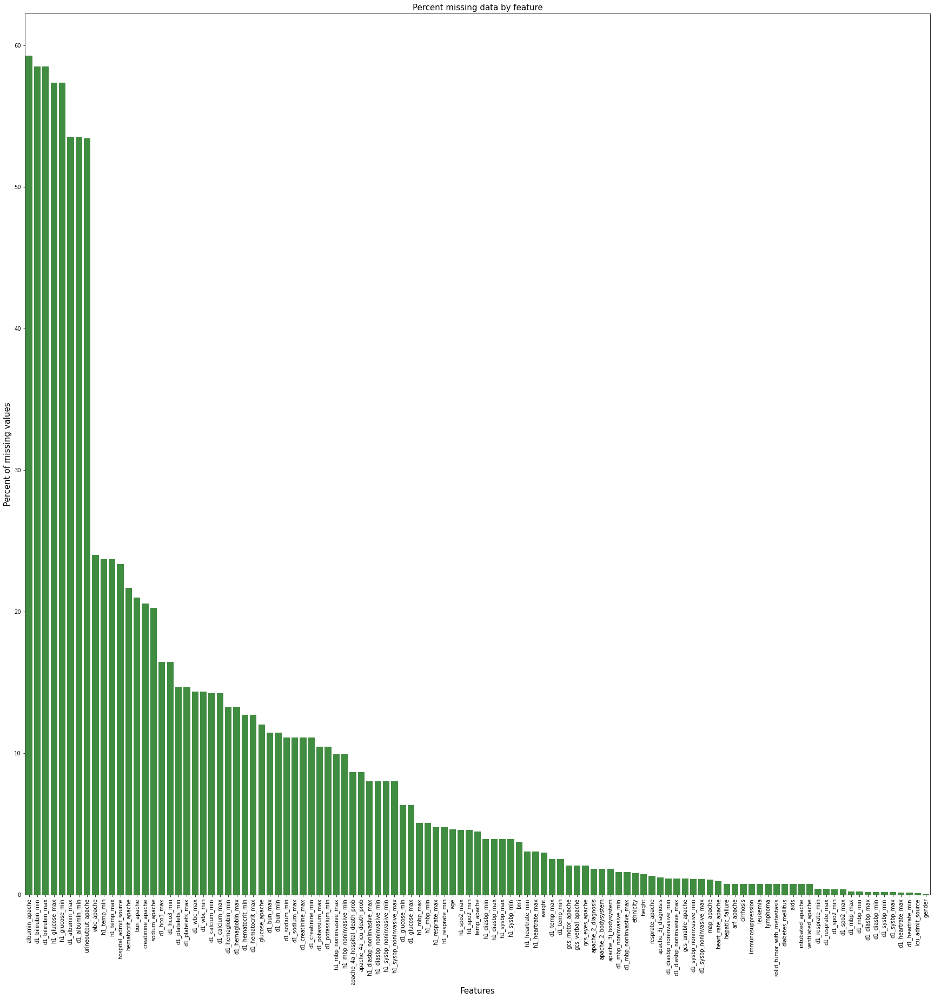

In [32]:
missingdata(df)

,Total,Percent
hospital_death,39308,100.00
d1_bilirubin_min,23584,60.00
d1_bilirubin_max,23584,60.00
h1_glucose_min,23015,58.55
h1_glucose_max,23015,58.55
d1_albumin_min,22801,58.01
d1_albumin_max,22801,58.01
urineoutput_apache,15039,38.26
hospital_admit_source,11948,30.40
wbc_apache,8330,21.19


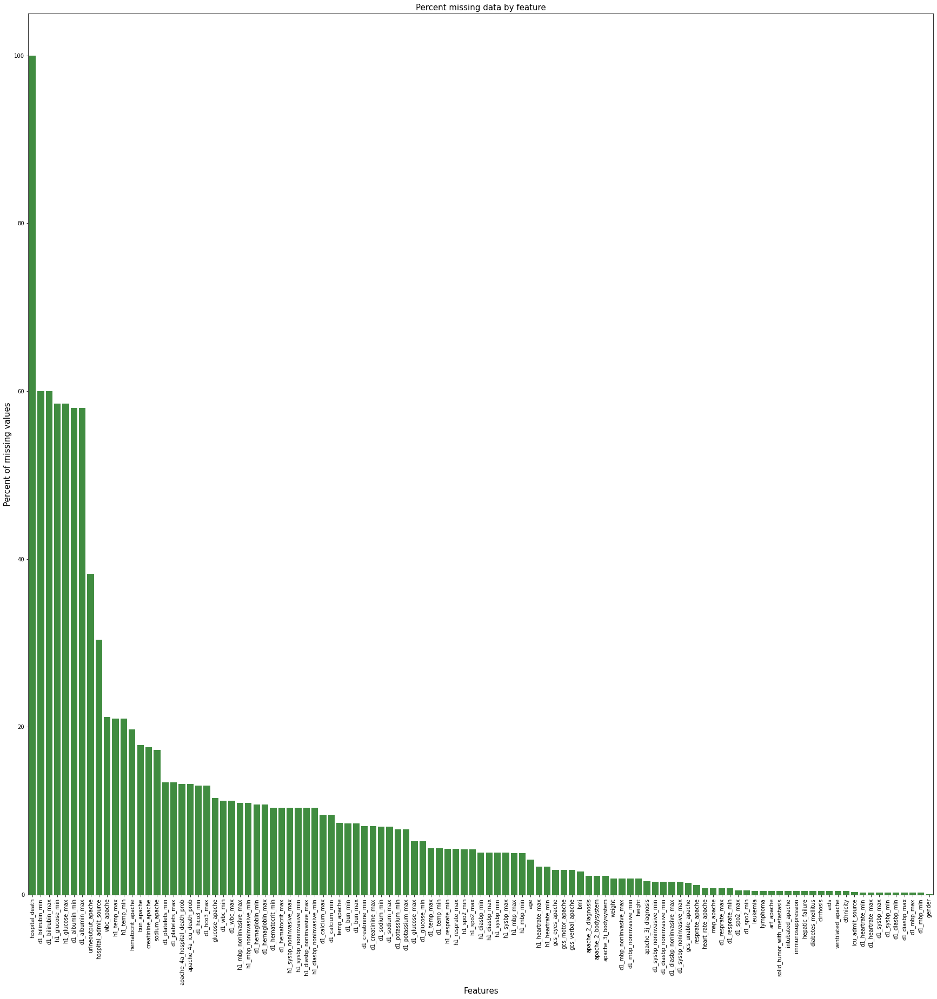

In [33]:
missingdata(dft)

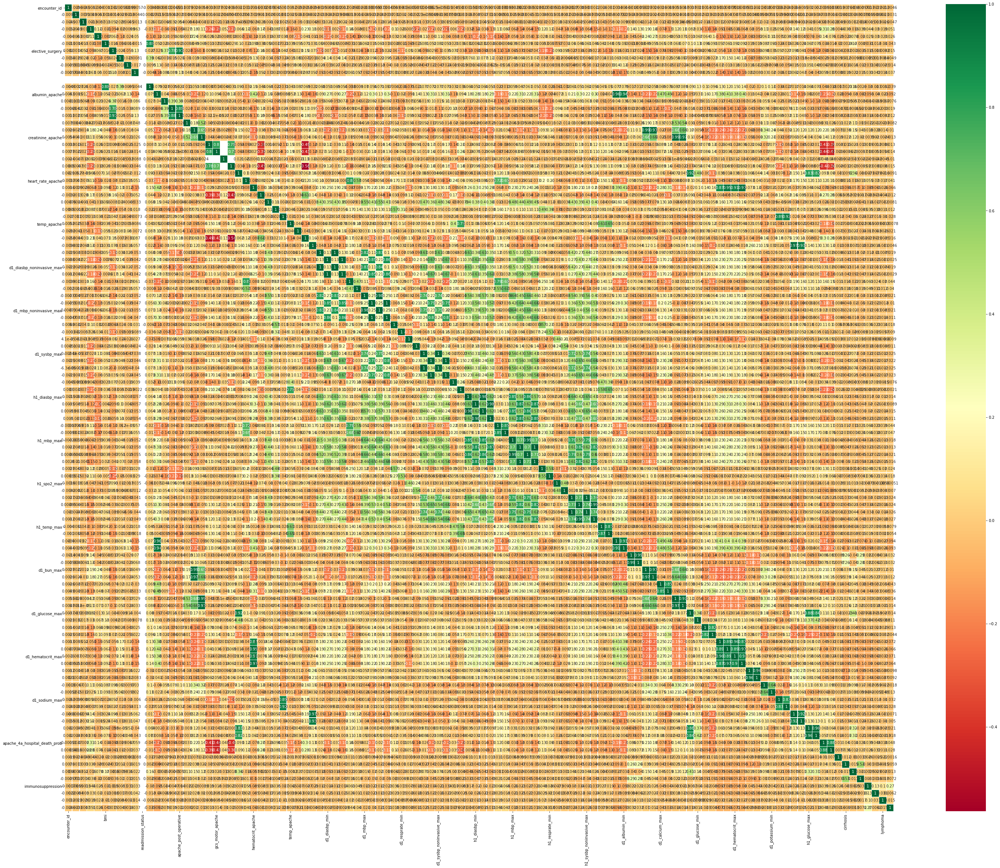

In [34]:
sns.heatmap(df.corr(),annot=True,cmap='RdYlGn',linewidths=0.2) #data.corr()-->correlation matrix
fig=plt.gcf()
fig.set_size_inches(50,40)
plt.show()

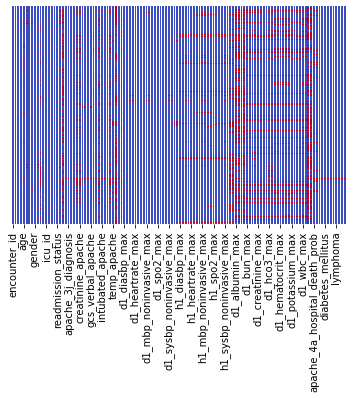

In [35]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap="coolwarm")

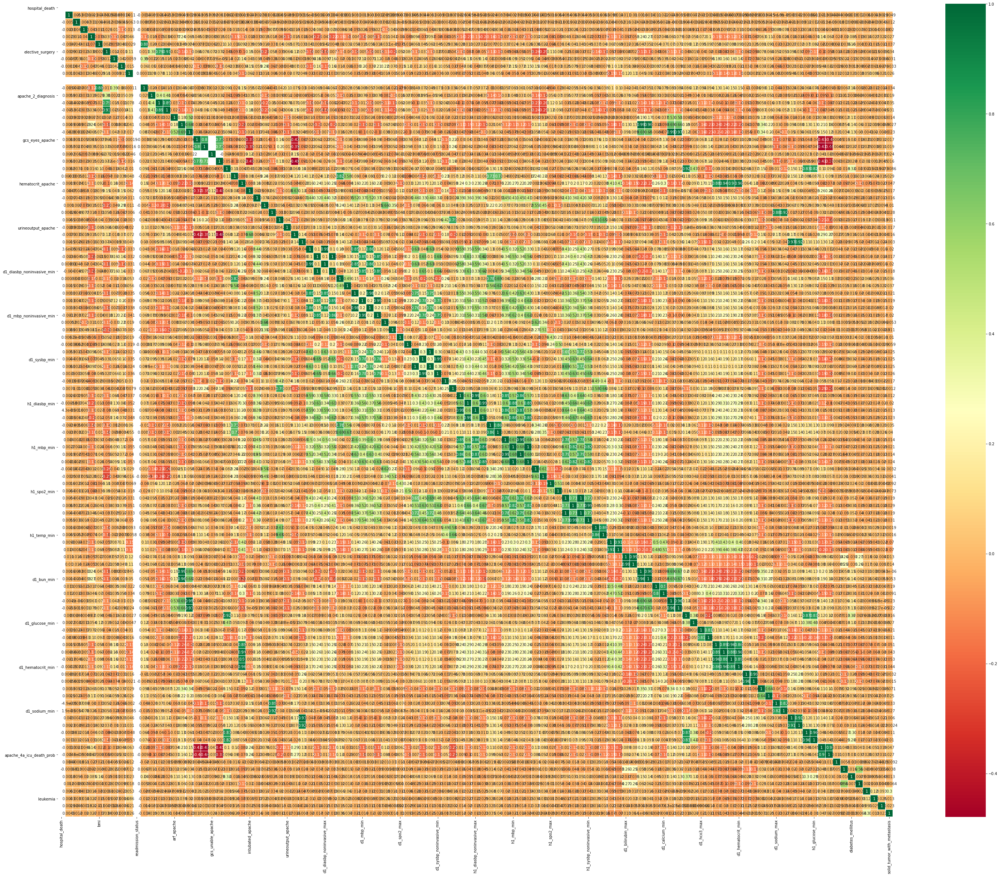

In [36]:
sns.heatmap(dft.corr(),annot=True,cmap='RdYlGn',linewidths=0.2) #data.corr()-->correlation matrix
fig=plt.gcf()
fig.set_size_inches(50,40)
plt.show()

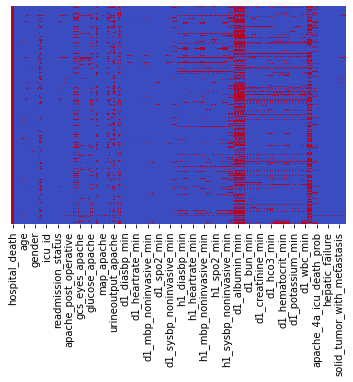

In [37]:
sns.heatmap(dft.isnull(),yticklabels=False,cbar=False,cmap="coolwarm")

In [38]:
null_df = df.loc[:,df.isnull().any()]
null_df

,age,bmi,ethnicity,gender,height,hospital_admit_source,icu_admit_source,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,h1_glucose_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,68.00,22.73,Caucasian,M,180.30,Floor,Floor,73.90,2.30,113.00,502.01,0.00,31.00,2.51,3.00,6.00,0.00,4.00,168.00,118.00,27.40,0.00,40.00,36.00,134.00,39.30,nan,0.00,14.10,68.00,37.00,68.00,37.00,119.00,72.00,89.00,46.00,89.00,46.00,34.00,10.00,100.00,74.00,131.00,73.00,131.00,73.00,39.90,37.20,68.00,63.00,68.00,63.00,119.00,108.00,86.00,85.00,86.00,85.00,26.00,18.00,100.00,74.00,131.00,115.00,131.00,115.00,39.50,37.50,2.30,2.30,0.40,0.40,31.00,30.00,8.50,7.40,2.51,2.23,168.00,109.00,19.00,15.00,8.90,8.90,27.40,27.40,233.00,233.00,4.00,3.40,136.00,134.00,14.10,14.10,nan,nan,0.10,0.05,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,Sepsis,Cardiovascular
1,77.00,27.42,Caucasian,F,160.00,Floor,Floor,70.20,nan,108.00,203.01,0.00,9.00,0.56,1.00,3.00,0.00,1.00,145.00,120.00,36.90,0.00,46.00,33.00,145.00,35.10,nan,1.00,12.70,95.00,31.00,95.00,31.00,118.00,72.00,120.00,38.00,120.00,38.00,32.00,12.00,100.00,70.00,159.00,67.00,159.00,67.00,36.30,35.10,61.00,48.00,61.00,48.00,114.00,100.00,85.00,57.00,85.00,57.00,31.00,28.00,95.00,70.00,95.00,71.00,95.00,71.00,36.30,36.30,1.60,1.60,0.50,0.50,11.00,9.00,8.60,8.00,0.71,0.56,145.00,128.00,27.00,26.00,11.30,11.10,36.90,36.10,557.00,487.00,4.20,3.80,145.00,145.00,23.30,12.70,145.00,143.00,0.47,0.29,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,Respiratory,Respiratory
2,25.00,31.95,Caucasian,F,172.70,Emergency Department,Accident & Emergency,95.30,nan,122.00,703.03,0.00,nan,nan,3.00,6.00,0.00,5.00,nan,102.00,nan,0.00,68.00,37.00,nan,36.70,nan,0.00,nan,88.00,48.00,88.00,48.00,96.00,68.00,102.00,68.00,102.00,68.00,21.00,8.00,98.00,91.00,148.00,105.00,148.00,105.00,37.00,36.70,88.00,58.00,88.00,58.00,96.00,78.00,91.00,83.00,91.00,83.00,20.00,16.00,98.00,91.00,148.00,124.00,148.00,124.00,36.70,36.70,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Metabolic,Metabolic
3,81.00,22.64,Caucasian,F,165.10,Operating Room,Operating Room / Recovery,61.70,nan,203.00,"1,206.03",0.00,nan,nan,4.00,6.00,0.00,5.00,185.00,114.00,25.90,1.00,60.00,4.00,nan,34.80,nan,1.00,8.00,48.00,42.00,48.00,42.00,116.00,92.00,84.00,84.00,84.00,84.00,23.00,7.00,100.00,95.00,158.00,84.00,158.00,84.00,38.00,34.80,62.00,44.00,nan,nan,100.00,96.00,9

In [39]:
null_df_test = dft.loc[:,dft.isnull().any()]
null_df_test

,hospital_death,age,bmi,ethnicity,gender,height,hospital_admit_source,icu_admit_source,weight,apache_2_diagnosis,apache_3j_diagnosis,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,h1_glucose_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,nan,56.00,21.10,Caucasian,M,180.30,Emergency Department,Accident & Emergency,68.60,301.00,405.01,0.00,19.00,0.67,2.00,5.00,0.00,1.00,276.00,105.00,42.00,0.00,57.00,5.00,134.00,36.60,"1,121.13",0.00,4.70,74.00,51.00,74.00,51.00,100.00,78.00,86.00,60.00,86.00,60.00,20.00,8.00,100.00,96.00,121.00,79.00,121.00,79.00,37.10,36.60,55.00,51.00,55.00,51.00,88.00,84.00,68.00,60.00,68.00,60.00,18.00,8.00,100.00,98.00,91.00,79.00,91.00,79.00,36.60,36.60,3.70,3.70,nan,nan,19.00,19.00,9.30,9.30,0.67,0.67,276.00,167.00,24.00,24.00,13.80,13.80,42.00,42.00,223.00,223.00,4.80,4.80,135.00,134.00,4.70,4.70,nan,nan,0.13,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Neurological,Neurologic
1,nan,nan,19.50,Caucasian,F,145.00,Operating Room,Operating Room / Recovery,41.00,217.00,"1,502.02",0.00,nan,nan,4.00,6.00,0.00,4.00,nan,60.00,nan,0.00,53.00,37.00,nan,37.00,843.44,0.00,nan,65.00,31.00,65.00,31.00,73.00,60.00,108.00,53.00,108.00,53.00,33.00,16.00,99.00,90.00,148.00,83.00,148.00,83.00,37.70,36.60,50.00,44.00,50.00,44.00,60.00,60.00,80.00,80.00,80.00,80.00,16.00,16.00,94.00,92.00,121.00,96.00,121.00,96.00,36.60,36.60,3.10,3.10,0.60,0.60,12.00,12.00,8.00,8.00,0.60,0.60,100.00,100.00,31.00,31.00,9.90,9.90,30.90,30.90,93.00,93.00,4.40,4.40,140.00,140.00,3.00,3.00,nan,nan,0.09,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Neurological,Neurologic
2,nan,66.00,32.52,African American,M,170.20,Operating Room,Operating Room / Recovery,94.20,302.00,"1,208.06",0.00,22.00,1.84,2.00,5.00,0.00,1.00,81.00,124.00,39.20,0.00,115.00,31.00,130.00,35.50,"1,728.00",0.00,14.80,85.00,57.00,nan,nan,117.00,86.00,110.00,71.00,nan,nan,28.00,10.00,100.00,95.00,172.00,102.00,nan,nan,37.50,35.50,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,22.00,19.00,8.70,8.40,1.84,1.63,117.00,81.00,22.00,19.00,12.70,12.20,40.90,39.20,184.00,181.00,4.70,4.50,135.00,130.00,14.80,10.00,nan,nan,0.03,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Cardiovascular,Cardiovascular
3,nan,64.00,20.80,Caucasian,M,182.80,Operating Room,Operating Room / Recovery,69.50,303.00,211.03,0.00,24.00,0.75,4.00,6.00,0.00,1.00,122.00,111.00,32.00,1.00,48.00,30.00,133.00,37.70,"1,434.41",1.00,9.70,63.00,42.00,63.00,42.00,111.00,60.00,76.00,48.00,76.00,48.00,35.00,15.00,100.00,92.00,

In [40]:
categorical_pred = df.select_dtypes(include=['object'])
print(categorical_pred.columns)
print("--"*30)
categorical_pred.isnull().sum() #just a test dataframe

Index(['ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem'], dtype='object')
------------------------------------------------------------


ethnicity                 1395
gender                      25
hospital_admit_source    21409
icu_admit_source           112
icu_stay_type                0
icu_type                     0
apache_3j_bodysystem      1662
apache_2_bodysystem       1662
dtype: int64

In [41]:
from sklearn.preprocessing import LabelEncoder # if data is nominal, use LE, if data is ordinal, use OE
categorical_feature_mask = df.dtypes==object
categorical_cols = df.columns[categorical_feature_mask].tolist()
print(categorical_cols)
df[categorical_cols] = df[categorical_cols].apply(lambda x: x.fillna(x.value_counts().index[0]))
le = LabelEncoder()
df[categorical_cols] = df[categorical_cols].astype(str).apply(lambda col: le.fit_transform(col)) 
df[categorical_cols].head()

['ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem']


,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,apache_3j_bodysystem,apache_2_bodysystem
0,2,1,4,1,0,2,9,0
1,2,0,4,1,0,5,8,6
2,2,0,3,0,0,5,5,3
3,2,0,8,2,0,2,0,0
4,2,1,3,0,0,5,10,7


In [42]:
categorical_feature_mask_test = dft.dtypes==object
categorical_cols_test = dft.columns[categorical_feature_mask_test].tolist()
print(categorical_cols_test)
dft[categorical_cols_test] = dft[categorical_cols_test].apply(lambda x: x.fillna(x.value_counts().index[0]))
le = LabelEncoder()
dft[categorical_cols_test] = dft[categorical_cols_test].astype(str).apply(lambda col: le.fit_transform(col)) 
dft[categorical_cols_test].head()

['ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem']


,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,apache_3j_bodysystem,apache_2_bodysystem
0,2,1,3,0,0,6,7,4
1,2,0,7,2,0,5,7,4
2,0,1,7,2,0,0,0,0
3,2,1,7,2,0,5,8,6
4,2,1,3,0,0,6,7,4


In [43]:
df[categorical_cols].isnull().sum()

ethnicity                0
gender                   0
hospital_admit_source    0
icu_admit_source         0
icu_stay_type            0
icu_type                 0
apache_3j_bodysystem     0
apache_2_bodysystem      0
dtype: int64

In [44]:
dft[categorical_cols_test].isnull().sum()

ethnicity                0
gender                   0
hospital_admit_source    0
icu_admit_source         0
icu_stay_type            0
icu_type                 0
apache_3j_bodysystem     0
apache_2_bodysystem      0
dtype: int64

In [45]:
numerical_pred = df.select_dtypes(exclude=['object'])
print(numerical_pred.columns)
print("--"*30)
print (numerical_pred.columns.tolist())
numerical_pred.isnull().sum() # test dataframe

Index(['encounter_id', 'patient_id', 'hospital_id', 'hospital_death', 'age', 'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height',
       ...
       'aids', 'cirrhosis', 'diabetes_mellitus', 'hepatic_failure', 'immunosuppression', 'leukemia', 'lymphoma', 'solid_tumor_with_metastasis', 'apache_3j_bodysystem', 'apache_2_bodysystem'], dtype='object', length=120)
------------------------------------------------------------
['encounter_id', 'patient_id', 'hospital_id', 'hospital_death', 'age', 'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height', 'hospital_admit_source', 'icu_admit_source', 'icu_id', 'icu_stay_type', 'icu_type', 'pre_icu_los_days', 'readmission_status', 'weight', 'albumin_apache', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_post_operative', 'arf_apache', 'bun_apache', 'creatinine_apache', 'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache', 'glucose_apache', 'heart_rate_apache', 'hematocrit_apache', 'intubated_apache', 'map_a

encounter_id                         0
patient_id                           0
hospital_id                          0
hospital_death                       0
age                               4228
bmi                               3429
elective_surgery                     0
ethnicity                            0
gender                               0
height                            1334
hospital_admit_source                0
icu_admit_source                     0
icu_id                               0
icu_stay_type                        0
icu_type                             0
pre_icu_los_days                     0
readmission_status                   0
weight                            2720
albumin_apache                   54379
apache_2_diagnosis                1662
apache_3j_diagnosis               1101
apache_post_operative                0
arf_apache                         715
bun_apache                       19262
creatinine_apache                18853
gcs_eyes_apache          

In [46]:
numerical_feature_mask = df.dtypes!=object
numerical_cols = df.columns[numerical_feature_mask].tolist()
print(numerical_cols)
df[numerical_cols] = df[numerical_cols].apply(lambda col: col.fillna(col.median()))
# another way is to use Simple Imputer, but this will not preserve data types
df[numerical_cols].head()

['encounter_id', 'patient_id', 'hospital_id', 'hospital_death', 'age', 'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height', 'hospital_admit_source', 'icu_admit_source', 'icu_id', 'icu_stay_type', 'icu_type', 'pre_icu_los_days', 'readmission_status', 'weight', 'albumin_apache', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_post_operative', 'arf_apache', 'bun_apache', 'creatinine_apache', 'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache', 'glucose_apache', 'heart_rate_apache', 'hematocrit_apache', 'intubated_apache', 'map_apache', 'resprate_apache', 'sodium_apache', 'temp_apache', 'urineoutput_apache', 'ventilated_apache', 'wbc_apache', 'd1_diasbp_max', 'd1_diasbp_min', 'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min', 'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min', 'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'd1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max', 'd1_sysbp_min', '

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,h1_glucose_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.00,22.73,0,2,1,180.30,4,1,92,0,2,0.54,0,73.90,2.30,113.00,502.01,0,0.00,31.00,2.51,3.00,6.00,0.00,4.00,168.00,118.00,27.40,0.00,40.00,36.00,134.00,39.30,"1,386.20",0.00,14.10,68.00,37.00,68.00,37.00,119.00,72.00,89.00,46.00,89.00,46.00,34.00,10.00,100.00,74.00,131.00,73.00,131.00,73.00,39.90,37.20,68.00,63.00,68.00,63.00,119.00,108.00,86.00,85.00,86.00,85.00,26.00,18.00,100.00,74.00,131.00,115.00,131.00,115.00,39.50,37.50,2.30,2.30,0.40,0.40,31.00,30.00,8.50,7.40,2.51,2.23,168.00,109.00,19.00,15.00,8.90,8.90,27.40,27.40,233.00,233.00,4.00,3.40,136.00,134.00,14.10,14.10,140.00,134.00,0.10,0.05,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,9,0
1,114252,59342,81,0,77.00,27.42,0,2,0,160.00,4,1,90,0,5,0.93,0,70.20,2.90,108.00,203.01,0,0.00,9.00,0.56,1.00,3.00,0.00,1.00,145.00,120.00,36.90,0.00,46.00,33.00,145.00,35.10,"1,386.20",1.00,12.70,95.00,31.00,95.00,31.00,118.00,72.00,120.00,38.00,120.00,38.00,32.00,12.00,100.00,70.00,159.00,67.00,159.00,67.00,36.30,35.10,61.00,48.00,61.00,48.00,114.00,100.00,85.00,57.00,85.00,57.00,31.00,28.00,95.00,70.00,95.00,71.00,95.00,71.00,36.30,36.30,1.60,1.60,0.50,0.50,11.00,9.00,8.60,8.00,0.71,0.56,145.00,128.00,27.00,26.00,11.30,11.10,36.90,36.10,557.00,487.00,4.20,3.80,145.00,145.00,23.30,12.70,145.00,143.00,0.47,0.29,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,8,6
2,119783,50777,118,0,25.00,31.95,0,2,0,172.70,3,0,93,0,5,0.00,0,95.30,2.90,122.00,703.03,0,0.00,19.00,0.98,3.00,6.00,0.00,5.00,133.00,102.00,33.20,0.00,68.00,37.00,138.00,36.70,"1,386.20",0.00,10.40,88.00,48.00,88.00,48.00,96.00,68.00,102.00,68.00,102.00,68.00,21.00,8.00,98.00,91.00,148.00,105.00,148.00,105.00,37.00,36.70,88.00,58.00,88.00,58.00,96.00,78.00,91.00,83.00,91.00,83.00,20.00,16.00,98.00,91.00,148.00,124.00,148.00,124.00,36.70,36.70,3.00,2.90,0.60,0.60,19.00,18.00,8.40,8.20,1.00,0.95,150.00,107.00,24.00,23.00,11.40,10.90,34.50,33.20,196.00,187.00,4.20,3.90,139.00,138.00,11.00,10.10,140.00,134.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5,3
3,79267,46918,118,0,81.00,22.64,1,2,0,165.10,8,2,92,0,2,0.00,0,61.70,2.90,203.00,"1,206.03",1,0.00,19.00,0.98,4.00,6.00,0.0

In [47]:
numerical_feature_mask_test = dft.dtypes!=object
numerical_cols_test = dft.columns[numerical_feature_mask_test].tolist()
print(numerical_cols_test)
dft[numerical_cols_test] = dft[numerical_cols_test].apply(lambda col: col.fillna(col.median()))
# # another way is to use Simple Imputer, but this will not preserve data types
dft[numerical_cols_test].head()

['hospital_death', 'encounter_id', 'patient_id', 'hospital_id', 'age', 'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height', 'hospital_admit_source', 'icu_admit_source', 'icu_id', 'icu_stay_type', 'icu_type', 'pre_icu_los_days', 'readmission_status', 'weight', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_post_operative', 'arf_apache', 'bun_apache', 'creatinine_apache', 'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache', 'glucose_apache', 'heart_rate_apache', 'hematocrit_apache', 'intubated_apache', 'map_apache', 'resprate_apache', 'sodium_apache', 'temp_apache', 'urineoutput_apache', 'ventilated_apache', 'wbc_apache', 'd1_diasbp_max', 'd1_diasbp_min', 'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min', 'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min', 'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'd1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max', 'd1_sysbp_min', 'd1_sysbp_noninvasi

,hospital_death,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,h1_glucose_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,nan,2,127112,7,56.00,21.10,0,2,1,180.30,3,0,1105,0,6,0.10,0,68.60,301.00,405.01,0,0.00,19.00,0.67,2.00,5.00,0.00,1.00,276.00,105.00,42.00,0.00,57.00,5.00,134.00,36.60,"1,121.13",0.00,4.70,74.00,51.00,74.00,51.00,100.00,78.00,86.00,60.00,86.00,60.00,20.00,8.00,100.00,96.00,121.00,79.00,121.00,79.00,37.10,36.60,55.00,51.00,55.00,51.00,88.00,84.00,68.00,60.00,68.00,60.00,18.00,8.00,100.00,98.00,91.00,79.00,91.00,79.00,36.60,36.60,3.70,3.70,0.70,0.70,19.00,19.00,9.30,9.30,0.67,0.67,276.00,167.00,24.00,24.00,13.80,13.80,42.00,42.00,223.00,223.00,4.80,4.80,135.00,134.00,4.70,4.70,140.00,134.00,0.13,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7,4
1,nan,5,130737,178,63.00,19.50,1,2,0,145.00,7,2,1043,0,5,0.23,0,41.00,217.00,"1,502.02",1,0.00,18.00,0.95,4.00,6.00,0.00,4.00,132.00,60.00,33.00,0.00,53.00,37.00,138.00,37.00,843.44,0.00,10.60,65.00,31.00,65.00,31.00,73.00,60.00,108.00,53.00,108.00,53.00,33.00,16.00,99.00,90.00,148.00,83.00,148.00,83.00,37.70,36.60,50.00,44.00,50.00,44.00,60.00,60.00,80.00,80.00,80.00,80.00,16.00,16.00,94.00,92.00,121.00,96.00,121.00,96.00,36.60,36.60,3.10,3.10,0.60,0.60,12.00,12.00,8.00,8.00,0.60,0.60,100.00,100.00,31.00,31.00,9.90,9.90,30.90,30.90,93.00,93.00,4.40,4.40,140.00,140.00,3.00,3.00,140.00,134.00,0.09,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7,4
2,nan,7,101458,86,66.00,32.52,1,0,1,170.20,7,2,1035,0,0,0.14,0,94.20,302.00,"1,208.06",1,0.00,22.00,1.84,2.00,5.00,0.00,1.00,81.00,124.00,39.20,0.00,115.00,31.00,130.00,35.50,"1,728.00",0.00,14.80,85.00,57.00,87.00,49.00,117.00,86.00,110.00,71.00,101.00,63.00,28.00,10.00,100.00,95.00,172.00,102.00,146.00,95.00,37.50,35.50,74.00,61.00,74.00,61.00,91.00,82.00,89.00,77.00,88.00,77.00,21.00,16.00,99.00,97.00,131.00,114.00,131.00,114.00,36.70,36.70,2.90,2.90,0.70,0.70,22.00,19.00,8.70,8.40,1.84,1.63,117.00,81.00,22.00,19.00,12.70,12.20,40.90,39.20,184.00,181.00,4.70,4.50,135.00,130.00,14.80,10.00,140.00,134.00,0.03,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0
3,nan,8,48067,163,64.00,20.80,0,2,1,182.80,7,2,1078,0,5,0.00,0,69.50,303.00,211.03,0,0.00,24.00,0.75,4.00,6.00,0.00,1.00,122.00,111.00,32.00,1.00,48.00,30.00,133.00,3

In [48]:
for i, col in enumerate(numerical_cols):
    print("\n ({} {}) Uniq_Val: {} \n {}".format(i,col, df[col].nunique(),df[col].unique()))
print('\n')


 (0 encounter_id) Uniq_Val: 91713 
 [ 66154 114252 119783 ...   8981  33776   1671]

 (1 patient_id) Uniq_Val: 91713 
 [ 25312  59342  50777 ...  58179 120598  53612]

 (2 hospital_id) Uniq_Val: 147 
 [118  81  33  83  77 149  31 151  69  46  63 113 137  89 168 150 140  34
  74 102  91 198 129   4 124  68 138 174 134 169  57 177 155  85  78  95
  98 105  76   5 116 119  79 171 161 128 147 112  32  55  17 136  44 179
  88  23 130  72 109  10 204 117 202  70 160  62  16 199  54 100 186  20
 107  14 132  87  53  21  99  71 182  24 200 189  60  84  26 133  27   8
 194 111 176 187  39 101  80  90  19  94  50 192  43 145 180  40   9  93
 185 159 166 157  64 125  92  13  37 139 135  51  18 181 158 196  47 103
 197  38 188   2  49 142  35  15 146  29  36 167  30 184 104 121 195   3
   6 183  66]

 (3 hospital_death) Uniq_Val: 2 
 [0 1]

 (4 age) Uniq_Val: 74 
 [68. 77. 25. 81. 19. 67. 59. 70. 45. 50. 72. 80. 48. 65. 78. 30. 46. 39.
 79. 58. 87. 60. 85. 76. 53. 71. 82. 52. 75. 64. 55. 73. 88. 


 (56 d1_sysbp_noninvasive_max) Uniq_Val: 143 
 [131. 159. 148. 158. 147. 173. 151. 104. 135. 145. 163. 139. 113. 152.
 169. 129. 146. 185. 179. 132. 112. 199. 170. 117. 171. 176. 111. 216.
 204. 208. 186. 155. 137. 166. 187. 110. 161. 127. 143. 150. 136. 201.
 167. 153. 142. 165. 105. 134. 116. 154. 126. 203. 114. 232. 172. 144.
 178. 162. 124. 120. 125. 223. 122.  90. 177. 190. 160. 188. 175. 157.
 226. 140. 128. 207. 189. 156. 138. 211. 130. 164. 215. 182.  96. 180.
 149. 103. 213. 141. 194. 198. 108. 200. 218. 133. 174. 115. 168. 195.
 181. 221. 197. 220. 193. 196.  91. 123.  95. 227. 214. 184. 202. 100.
  94. 191. 119. 118.  97. 183. 192. 106. 219. 121. 107. 109. 231. 212.
 209. 222.  98. 101. 210. 229.  93. 230. 217. 206. 205. 224. 102. 228.
 225.  92.  99.]

 (57 d1_sysbp_noninvasive_min) Uniq_Val: 120 
 [ 73.    67.   105.    84.   120.   107.   133.    71.    98.    78.
  95.   131.   111.   103.   106.    89.    97.   102.    96.    90.
 129.    83.    74.   138.   136.    85


 (100 d1_potassium_max) Uniq_Val: 100 
 [4.   4.2  5.   3.9  5.8  5.2  4.1  4.4  4.9  5.5  4.3  4.8  3.4  3.7
 3.5  4.5  3.1  3.8  3.3  5.4  4.6  4.7  3.6  2.8  5.3  7.   3.   6.1
 5.1  3.2  6.7  5.7  6.   6.4  2.9  5.6  5.9  6.8  6.2  6.6  6.5  6.9
 6.3  4.73 5.71 4.92 4.24 4.02 3.67 6.53 4.03 5.07 4.11 3.55 3.91 6.55
 5.05 3.82 4.12 4.31 4.96 4.05 4.65 4.52 5.58 4.22 4.34 5.92 4.72 4.04
 5.51 4.82 4.29 4.07 5.04 5.37 3.78 4.51 3.62 4.48 4.06 3.87 4.27 5.09
 4.38 4.66 3.97 5.25 4.01 3.68 6.26 4.36 4.63 6.01 4.46 3.74 5.28 6.58
 5.06 3.86]

 (101 d1_potassium_min) Uniq_Val: 116 
 [3.4  3.8  3.9  3.5  3.7  4.2  2.4  5.2  3.3  4.3  4.4  4.9  5.5  4.1
 4.   3.2  3.6  3.1  5.4  2.8  4.6  4.5  2.7  4.8  4.7  3.   5.3  5.1
 2.9  5.8  5.6  2.5  5.   2.6  5.7  3.59 3.29 4.92 4.24 4.07 3.93 3.55
 4.63 3.66 4.43 3.95 3.35 4.27 4.05 4.37 4.15 3.57 4.06 5.58 4.39 3.81
 4.48 3.62 3.71 3.41 3.72 3.56 3.88 3.78 4.29 3.76 3.44 3.53 4.03 3.87
 3.98 3.91 4.04 4.02 3.68 4.14 3.86 3.89 4.99 3.24 3.49 4.7

In [49]:
# check for insignificant change < 1%, found out readmission_status has only 1 value
lowvar_columns1=[]
threshold = 0.01
lowvar_columns1 = df[numerical_cols].std()[df[numerical_cols].std() < threshold].index.values
print(len(lowvar_columns1),lowvar_columns1)

1 ['readmission_status']


In [50]:
# check for insignificant change < 1%, found out readmission_status has only 1 value
lowvar_columns2=[]
threshold = 0.01
lowvar_columns2 = dft[numerical_cols_test].std()[dft[numerical_cols_test].std() < threshold].index.values
print(len(lowvar_columns2),lowvar_columns2)

1 ['readmission_status']


In [51]:
df.drop(lowvar_columns1, axis=1)
dft.drop(lowvar_columns2, axis=1)

,hospital_death,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,h1_glucose_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,nan,2,127112,7,56.00,21.10,0,2,1,180.30,3,0,1105,0,6,0.10,68.60,301.00,405.01,0,0.00,19.00,0.67,2.00,5.00,0.00,1.00,276.00,105.00,42.00,0.00,57.00,5.00,134.00,36.60,"1,121.13",0.00,4.70,74.00,51.00,74.00,51.00,100.00,78.00,86.00,60.00,86.00,60.00,20.00,8.00,100.00,96.00,121.00,79.00,121.00,79.00,37.10,36.60,55.00,51.00,55.00,51.00,88.00,84.00,68.00,60.00,68.00,60.00,18.00,8.00,100.00,98.00,91.00,79.00,91.00,79.00,36.60,36.60,3.70,3.70,0.70,0.70,19.00,19.00,9.30,9.30,0.67,0.67,276.00,167.00,24.00,24.00,13.80,13.80,42.00,42.00,223.00,223.00,4.80,4.80,135.00,134.00,4.70,4.70,140.00,134.00,0.13,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7,4
1,nan,5,130737,178,63.00,19.50,1,2,0,145.00,7,2,1043,0,5,0.23,41.00,217.00,"1,502.02",1,0.00,18.00,0.95,4.00,6.00,0.00,4.00,132.00,60.00,33.00,0.00,53.00,37.00,138.00,37.00,843.44,0.00,10.60,65.00,31.00,65.00,31.00,73.00,60.00,108.00,53.00,108.00,53.00,33.00,16.00,99.00,90.00,148.00,83.00,148.00,83.00,37.70,36.60,50.00,44.00,50.00,44.00,60.00,60.00,80.00,80.00,80.00,80.00,16.00,16.00,94.00,92.00,121.00,96.00,121.00,96.00,36.60,36.60,3.10,3.10,0.60,0.60,12.00,12.00,8.00,8.00,0.60,0.60,100.00,100.00,31.00,31.00,9.90,9.90,30.90,30.90,93.00,93.00,4.40,4.40,140.00,140.00,3.00,3.00,140.00,134.00,0.09,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7,4
2,nan,7,101458,86,66.00,32.52,1,0,1,170.20,7,2,1035,0,0,0.14,94.20,302.00,"1,208.06",1,0.00,22.00,1.84,2.00,5.00,0.00,1.00,81.00,124.00,39.20,0.00,115.00,31.00,130.00,35.50,"1,728.00",0.00,14.80,85.00,57.00,87.00,49.00,117.00,86.00,110.00,71.00,101.00,63.00,28.00,10.00,100.00,95.00,172.00,102.00,146.00,95.00,37.50,35.50,74.00,61.00,74.00,61.00,91.00,82.00,89.00,77.00,88.00,77.00,21.00,16.00,99.00,97.00,131.00,114.00,131.00,114.00,36.70,36.70,2.90,2.90,0.70,0.70,22.00,19.00,8.70,8.40,1.84,1.63,117.00,81.00,22.00,19.00,12.70,12.20,40.90,39.20,184.00,181.00,4.70,4.50,135.00,130.00,14.80,10.00,140.00,134.00,0.03,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0
3,nan,8,48067,163,64.00,20.80,0,2,1,182.80,7,2,1078,0,5,0.00,69.50,303.00,211.03,0,0.00,24.00,0.75,4.00,6.00,0.00,1.00,122.00,111.00,32.00,1.00,48.00,30.00,133.00,37.70,"1,434.41",1.00,9.70,6

In [52]:
# Drop highly correlated features 
drop_columns=[]
corr = df[numerical_cols].corr()
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >=0.99 :
            if columns[j]:
                columns[j] = False
                print('FEAT_A: {} FEAT_B: {} - Correlation: {}'.format(df[numerical_cols].columns[i] , df[numerical_cols].columns[j], corr.iloc[i,j]))
        elif corr.iloc[i,j] <= -0.995:
            if columns[j]:
                columns[j] = False

drop_columns = df[numerical_cols].columns[columns == False].values
print('drop_columns',len(drop_columns),drop_columns)

FEAT_A: d1_diasbp_max FEAT_B: d1_diasbp_noninvasive_max - Correlation: 0.9927849344435937
FEAT_A: d1_diasbp_min FEAT_B: d1_diasbp_noninvasive_min - Correlation: 0.9930681828741015
FEAT_A: d1_mbp_min FEAT_B: d1_mbp_noninvasive_min - Correlation: 0.9906518560720169
FEAT_A: d1_sysbp_max FEAT_B: d1_sysbp_noninvasive_max - Correlation: 0.9922226070109745
FEAT_A: d1_sysbp_min FEAT_B: d1_sysbp_noninvasive_min - Correlation: 0.9925000582350074
drop_columns 5 ['d1_diasbp_noninvasive_max' 'd1_diasbp_noninvasive_min'
 'd1_mbp_noninvasive_min' 'd1_sysbp_noninvasive_max'
 'd1_sysbp_noninvasive_min']


In [53]:
df.drop(drop_columns, axis=1)

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_glucose_max,h1_glucose_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.00,22.73,0,2,1,180.30,4,1,92,0,2,0.54,0,73.90,2.30,113.00,502.01,0,0.00,31.00,2.51,3.00,6.00,0.00,4.00,168.00,118.00,27.40,0.00,40.00,36.00,134.00,39.30,"1,386.20",0.00,14.10,68.00,37.00,119.00,72.00,89.00,46.00,89.00,34.00,10.00,100.00,74.00,131.00,73.00,39.90,37.20,68.00,63.00,68.00,63.00,119.00,108.00,86.00,85.00,86.00,85.00,26.00,18.00,100.00,74.00,131.00,115.00,131.00,115.00,39.50,37.50,2.30,2.30,0.40,0.40,31.00,30.00,8.50,7.40,2.51,2.23,168.00,109.00,19.00,15.00,8.90,8.90,27.40,27.40,233.00,233.00,4.00,3.40,136.00,134.00,14.10,14.10,140.00,134.00,0.10,0.05,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,9,0
1,114252,59342,81,0,77.00,27.42,0,2,0,160.00,4,1,90,0,5,0.93,0,70.20,2.90,108.00,203.01,0,0.00,9.00,0.56,1.00,3.00,0.00,1.00,145.00,120.00,36.90,0.00,46.00,33.00,145.00,35.10,"1,386.20",1.00,12.70,95.00,31.00,118.00,72.00,120.00,38.00,120.00,32.00,12.00,100.00,70.00,159.00,67.00,36.30,35.10,61.00,48.00,61.00,48.00,114.00,100.00,85.00,57.00,85.00,57.00,31.00,28.00,95.00,70.00,95.00,71.00,95.00,71.00,36.30,36.30,1.60,1.60,0.50,0.50,11.00,9.00,8.60,8.00,0.71,0.56,145.00,128.00,27.00,26.00,11.30,11.10,36.90,36.10,557.00,487.00,4.20,3.80,145.00,145.00,23.30,12.70,145.00,143.00,0.47,0.29,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,8,6
2,119783,50777,118,0,25.00,31.95,0,2,0,172.70,3,0,93,0,5,0.00,0,95.30,2.90,122.00,703.03,0,0.00,19.00,0.98,3.00,6.00,0.00,5.00,133.00,102.00,33.20,0.00,68.00,37.00,138.00,36.70,"1,386.20",0.00,10.40,88.00,48.00,96.00,68.00,102.00,68.00,102.00,21.00,8.00,98.00,91.00,148.00,105.00,37.00,36.70,88.00,58.00,88.00,58.00,96.00,78.00,91.00,83.00,91.00,83.00,20.00,16.00,98.00,91.00,148.00,124.00,148.00,124.00,36.70,36.70,3.00,2.90,0.60,0.60,19.00,18.00,8.40,8.20,1.00,0.95,150.00,107.00,24.00,23.00,11.40,10.90,34.50,33.20,196.00,187.00,4.20,3.90,139.00,138.00,11.00,10.10,140.00,134.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5,3
3,79267,46918,118,0,81.00,22.64,1,2,0,165.10,8,2,92,0,2,0.00,0,61.70,2.90,203.00,"1,206.03",1,0.00,19.00,0.98,4.00,6.00,0.00,5.00,185.00,114.00,25.90,1.00,60.00,4.00,138.00,34.80,"1,386.20",1.00,8.00,48.00,42.00,116.00,92.00,84.00,84.00,84.00,23.00,7.00,100.00,95.00,158.00,84.00,38.00,34.80,62.00,44.00,74.00,62.00,100.00,96.00,92.00,71.00,9

In [54]:
(df[numerical_cols] == 0).sum()

encounter_id                         0
patient_id                           0
hospital_id                          0
hospital_death                   83798
age                                  0
bmi                                  0
elective_surgery                 74862
ethnicity                         9547
gender                           42219
height                               0
hospital_admit_source             1910
icu_admit_source                 54172
icu_id                               0
icu_stay_type                    86183
icu_type                          7156
pre_icu_los_days                  3711
readmission_status               91713
weight                               0
albumin_apache                       0
apache_2_diagnosis                   0
apache_3j_diagnosis                  0
apache_post_operative            73269
arf_apache                       89167
bun_apache                           0
creatinine_apache                    0
gcs_eyes_apache          

In [55]:
# Drop highly correlated features 
drop_columns=[]
corr = dft[numerical_cols_test].corr()
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >=0.99 :
            if columns[j]:
                columns[j] = False
                print('FEAT_A: {} FEAT_B: {} - Correlation: {}'.format(dft[numerical_cols_test].columns[i] , dft[numerical_cols_test].columns[j], corr.iloc[i,j]))
        elif corr.iloc[i,j] <= -0.995:
            if columns[j]:
                columns[j] = False

drop_columns = dft[numerical_cols_test].columns[columns == False].values
print('drop_columns',len(drop_columns),drop_columns)

FEAT_A: d1_diasbp_min FEAT_B: d1_diasbp_noninvasive_min - Correlation: 0.9910605257372072
drop_columns 1 ['d1_diasbp_noninvasive_min']


In [56]:
(dft[numerical_cols_test] == 0).sum()

hospital_death                       0
encounter_id                         0
patient_id                           0
hospital_id                          0
age                                  0
bmi                                  0
elective_surgery                 31450
ethnicity                         4471
gender                           17781
height                               0
hospital_admit_source              212
icu_admit_source                 23245
icu_id                               0
icu_stay_type                    39080
icu_type                          4123
pre_icu_los_days                  1635
readmission_status               39308
weight                               0
apache_2_diagnosis                   0
apache_3j_diagnosis                  0
apache_post_operative            30795
arf_apache                       38210
bun_apache                           0
creatinine_apache                    0
gcs_eyes_apache                      0
gcs_motor_apache         

In [57]:
cols_0_notsense = ['urineoutput_apache','d1_heartrate_min','d1_resprate_min','d1_spo2_max','d1_spo2_min','h1_resprate_min','h1_spo2_max','h1_spo2_min']
df[cols_0_notsense]= df[cols_0_notsense].replace(0,df[cols_0_notsense].apply(lambda x:x.mean()))
df[cols_0_notsense].head()

,urineoutput_apache,d1_heartrate_min,d1_resprate_min,d1_spo2_max,d1_spo2_min,h1_resprate_min,h1_spo2_max,h1_spo2_min
0,"1,386.20",72.00,10.00,100.00,74.00,18.00,100.00,74.00
1,"1,386.20",72.00,12.00,100.00,70.00,28.00,95.00,70.00
2,"1,386.20",68.00,8.00,98.00,91.00,16.00,98.00,91.00
3,"1,386.20",92.00,7.00,100.00,95.00,11.00,100.00,99.00
4,"1,386.20",60.00,16.00,100.00,96.00,16.00,100.00,100.00


In [58]:
cols_0_notsense = ['urineoutput_apache','d1_heartrate_min','d1_resprate_min','d1_spo2_max','d1_spo2_min','h1_resprate_min','h1_spo2_max','h1_spo2_min']
dft[cols_0_notsense]= dft[cols_0_notsense].replace(0,dft[cols_0_notsense].apply(lambda x:x.mean()))
dft[cols_0_notsense].head()

,urineoutput_apache,d1_heartrate_min,d1_resprate_min,d1_spo2_max,d1_spo2_min,h1_resprate_min,h1_spo2_max,h1_spo2_min
0,"1,121.13",78.00,8.00,100.00,96.00,8.00,100.00,98.00
1,843.44,60.00,16.00,99.00,90.00,16.00,94.00,92.00
2,"1,728.00",86.00,10.00,100.00,95.00,16.00,99.00,97.00
3,"1,434.41",60.00,15.00,100.00,92.00,23.00,95.00,93.00
4,"1,571.36",62.00,12.31,100.00,95.00,16.00,100.00,99.00


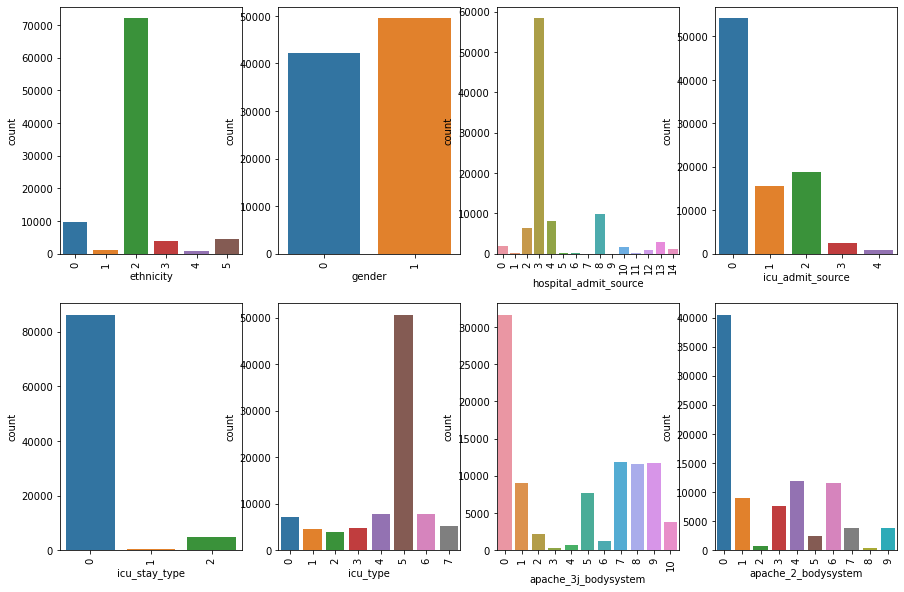

In [59]:
# Analyze categorical variables
fig, ax = plt.subplots(2, 4, figsize=(15, 10))
for variable, subplot in zip(categorical_cols, ax.flatten()):
    sns.countplot(df[variable], ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)

In [60]:
Analyze relationship between hospital_death and categoricals (cannot and seems far-fetched)
from statsmodels.graphics.mosaicplot import mosaic
_ = mosaic(df[categorical_cols], ['hospital_death'])

SyntaxError: invalid syntax (<ipython-input-60-631d55ca101b>, line 1)

In [ ]:
#Correlataion matrix for numerical (heatmap style)
df_num = df[df.columns.difference(categorical_cols)] # difference() won't drop anything but will sort alphabetically
corrmat = df_num.corr()
plt.figure(figsize=(12,10))
sns.heatmap(corrmat, cmap='Spectral_r', square =True)
plt.title('Correlation matrix')

In [ ]:
sort_corr = corrmat[['hospital_death']].unstack().abs().sort_values(kind='quicksort', ascending=False)
sort_corr

In [ ]:
# hospital_death correlation matrix for top 10 numericals
k = 11
cols = corrmat.abs().nlargest(k,'hospital_death',keep='all')['hospital_death'].index
print(cols)
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1.25)
heatmap = sns.heatmap(cm, cbar=True, square = True, annot=True,fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values,cmap ='RdYlGn')
plt.show()  

In [ ]:
# Analyze distributions of numerical variables
df_num.hist(bins=50,figsize=(50, 35))
plt.show()

In [ ]:
# Scatter plots between 'hospital_death' and correlated variables
from pandas.plotting import scatter_matrix
p=scatter_matrix(df_num[cols],alpha=0.2,figsize=(30, 30),diagonal='kde')

In [ ]:
p=sns.pairplot(df_num[cols], hue = 'hospital_death')
p.set(xticklabels=[])

In [ ]:
y = df['hospital_death'].values
from sklearn.preprocessing import StandardScaler
X = df.drop(['hospital_death'],axis = 1).values
df[numerical_cols].head()
print(X)

In [ ]:
X_test = dft.drop(['hospital_death'],axis = 1).values
dft[numerical_cols_test].head()
feature_scaler = StandardScaler()
X_test = feature_scaler.fit_transform(X_test.astype(float))
print(X_test)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.30, random_state=42, stratify=y)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_val.shape,  y_val.shape)

In [ ]:
feature_scaler = StandardScaler()
X_train = feature_scaler.fit_transform(X_train.astype(float))
X_val = feature_scaler.transform(X_val.astype(float))
print(X_train)

In [ ]:
from imblearn.over_sampling import SMOTE
print("Before OverSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train==0)))
oversample = SMOTE(sampling_strategy=0.3, random_state=42)
X_train_res, y_train_res = oversample.fit_sample(X_train, y_train.ravel())
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res==0)))

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC
from sklearn.metrics import precision_recall_fscore_support as score 
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, precision_recall_curve
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import KFold, cross_val_score, cross_val_predict

In [ ]:
X_train_res.shape[1]

In [ ]:
from keras.models import Sequential, Model, load_model, save_model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Dropout
from keras import regularizers
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from keras.wrappers.scikit_learn import KerasClassifier
from adasopt import AdasOptimizer
# from kerastuner.tuners import RandomSearch

# METRICS = [
#     AUC(name='auc')
# ]

def create_model(num_shape):
    input_ = Input(shape=(num_shape,))
    x = Dense(250,activation='relu',kernel_regularizer=regularizers.l2(0.001))(input_)
    x = Dropout(0.5)(x)
    x = Dense(250,activation='relu',kernel_regularizer=regularizers.l2(0.001))(x)
    x = Dropout(0.5)(x)
    x = Dense(250,activation='relu',kernel_regularizer=regularizers.l2(0.001))(x)
    x = Dropout(0.5)(x)
    output_ = Dense(1,activation='sigmoid')(x)
    model = Model([input_], output_)
    weigh_load="model_WIDS_2020_best"
    if os.path.exists(weigh_load):
        model.load_weights(weigh_load)
        print("Loaded weight")
    print(model.summary())
    model.compile(optimizer=AdasOptimizer(), loss='binary_crossentropy', metrics=['binary_accuracy'])
    return model

In [ ]:
 # FIT / TRAIN model

path = 'model_WIDS_2020'
if not os.path.isdir(path):
    os.mkdir(path)
ckpt_callback = ModelCheckpoint(filepath=path,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)
es_callback = EarlyStopping(monitor='val_loss', patience=3,
                            verbose=1, mode='min', restore_best_weights=True)
NumEpochs = 20
BatchSize = 100

num_shape = X_train_res.shape[1]
model = create_model(num_shape)
history = model.fit(X_train_res, y_train_res, 
                    epochs=NumEpochs, batch_size=BatchSize, 
                    validation_data=(X_val, y_val), callbacks=[es_callback,ckpt_callback],
                    verbose=1, shuffle=True)

results = model.evaluate(X_val, y_val)
print("_"*100)
print("Val Loss and Accuracy")
print("results ", results)

In [ ]:
history_dict = history.history
history_dict.keys()
# VALIDATION LOSS curves

# plt.figure(1,figsize=(7,5))
plt.clf()
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, (len(history_dict['loss']) + 1))
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# VALIDATION ACCURACY curves

# plt.figure(2,figsize=(7,5))
plt.clf()
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']
epochs = range(1, (len(history_dict['binary_accuracy']) + 1))
plt.plot(epochs, acc_values, 'bo', label='Training acc')
plt.plot(epochs, val_acc_values, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Classification report
cr_DL = pd.DataFrame(classification_report(y_val,y_pred, output_dict=True))
print("Classification Report of Random Forest Classifier on sample 1:\n", cr_DL)

In [ ]:
def model_assessment(y_val,y_pred):
    cm = confusion_matrix(y_val,y_pred)
    class_label = ["Survival", "Death"]
    df_cm = pd.DataFrame(cm, index=class_label,columns=class_label)
    print('confusion matrix')
    print(confusion_matrix(y_val,y_pred))
    precision, recall, fscore, train_support = score(y_val, y_pred, average='binary')
    print('Precision: {}% / Recall: {}%  / F1-Score: {}%  / Accuracy: {}% / AUC: {}%'.format(
    round(100*precision, 3), round(100*recall, 3), round(100*fscore,3), round(100 * accuracy_score(y_val, y_pred), 3), round(100 * roc_auc_score(y_val, y_pred), 3)))
    
    sns.heatmap(df_cm, annot=True,fmt='3.0f',cmap="summer")
    plt.title('Confusion_matrix', y=1.05, size=15)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")

In [ ]:
# AUC/ROC curves should be used when there are roughly equal numbers of observations for each class
# Precision-Recall curves should be used when there is a moderate to large class imbalance

y_pred1 = model.predict(X_val)
y_pred = y_pred1.copy()
y_pred[ np.where( y_pred >= 0.5 ) ] = 1
y_pred[ np.where( y_pred < 0.5 ) ] = 0
# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# plot no skill
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
plt.title('ROC ')
# show the plot
plt.show()

In [ ]:
assess = model_assessment(y_val,y_pred)

In [ ]:
def model_report(y_val,y_pred):
    true = np.random.randint(0, 10, size=100)
    pred = np.random.randint(0, 10, size=100)
    target_names = ["Survival", "Death"]

    clf_report = classification_report(y_val,
                                   y_pred,
                                   target_names=target_names,
                                   output_dict=True)

    sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True)

In [ ]:
report = model_report(y_val,y_pred)

In [ ]:
save_model(model,"WIDS.h5")

In [ ]:
num_shape = X_test.shape[1]
model = create_model(num_shape)
final_predictions = model.predict(X_test)
final_predictions
dft['hospital_death'] = final_predictions
dft[["encounter_id","hospital_death"]].to_csv("submission_vnteam.csv",index=False)
dft[["encounter_id","hospital_death"]].head(30)

In [ ]:
dft[["encounter_id","hospital_death"]].describe()